In [2]:
from urllib.parse import quote
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from matplotlib.ticker import MultipleLocator
from numpy.random import shuffle,randint,rand
from numpy import radians,sin,cos,inf,exp
from numpy import array,r_,c_,arange
from numpy.lib.scimath import arccos
import numpy as np
import pandas as pd
import folium as fm
import pylab as plt
import sympy as sy
import urllib
import xlwt
import json
import math
import time

In [3]:
class getpoi:
    output_path= '' #the ouput path
    path_class = 'amap_poicode.xlsx' #access the poicode spreasheet
    with open('key.txt','r') as f:
        amap_web_key = f.read() #access the key to Amap WEB service (localized)
    #keywords-searching API service url
    poi_search_url = 'https://restapi.amap.com/v3/place/text?key=%s&extensions=all&keywords=&types=%s&city=%s&citylimit=true&offset=25&page=%s&output=json'
    cityname = '成都'
    areas = ['锦江区','青羊区','金牛区','武侯区','成华区'] 
    totalcontent = {}

    def __init__(self):
        data_class = self.getclass()
        for type_class in data_class:
            for area in self.areas:
                page = 1;
                if type_class['type_num'] / 10000 < 10:
                    classtype = str('0') + str(type_class['type_num'])
                else:
                    classtype = str(type_class['type_num'])
                while True:
                    if classtype[-4:] =="0000":
                        break;
                    if classtype=='070401' or classtype=='070500' or classtype=='070501': #typecode for post express, logistic express and logistic warehousing
                        poidata = self.get_poi(classtype, area, page);
                        poidata = json.loads(poidata)
                        if poidata['count'] == '0':
                            break;
                        else:
                            poilist = self.hand(poidata)
                            print('area：' + area + '  type：' + classtype + '  page：' + str(page) + '  count：' + poidata['count'] + 'poilist:')
                            page += 1
                            for pois in poilist:
                                if classtype[0:2] in self.totalcontent.keys():
                                    pois['bigclass'] = type_class['bigclass']
                                    pois['midclass'] = type_class['midclass']
                                    pois['smallclass'] = type_class['smallclass']
                                    list_total = self.totalcontent[classtype[0:2]]
                                    list_total.append(pois)
                                else:
                                    self.totalcontent[classtype[0:2]] = []
                                    pois['bigclass'] = type_class['bigclass']
                                    pois['midclass'] = type_class['midclass']
                                    pois['smallclass'] = type_class['smallclass']
                                    self.totalcontent[classtype[0:2]].append(pois)
                    else:
                        break
        for content in self.totalcontent:
            self.writeexcel(self.totalcontent[content], content)
            
    def writeexcel(self, data, classname):
        book = xlwt.Workbook(encoding='utf-8', style_compression=0)
        sheet = book.add_sheet(classname, cell_overwrite_ok=True)
        # the first row is the headers
        sheet.write(0, 0, 'x')
        sheet.write(0, 1, 'y')
        sheet.write(0, 2, 'count')
        sheet.write(0, 3, 'name')
        sheet.write(0, 4, 'adname')
        sheet.write(0, 5, 'smallclass')
        sheet.write(0, 6, 'typecode')
        sheet.write(0, 7, 'midclass')
        classname = data[0]['bigclass']
        for i in range(len(data)):
            sheet.write(i + 1, 0, data[i]['lng'])
            sheet.write(i + 1, 1, data[i]['lat'])
            sheet.write(i + 1, 2, 1)
            sheet.write(i + 1, 3, data[i]['name'])
            sheet.write(i + 1, 4, data[i]['adname'])
            sheet.write(i + 1, 5, data[i]['smallclass'])
            sheet.write(i + 1, 6, data[i]['classname'])
            sheet.write(i + 1, 7, data[i]['midclass'])
        book.save(self.output_path + self.cityname + '_' + classname + '_快递点POI.xls')

    def hand(self, poidate):
        pois = poidate['pois']
        poilist = []
        for i in range(len(pois)):
            content = {}
            content['lng'] = float(str(pois[i]['location']).split(",")[0])
            content['lat'] = float(str(pois[i]['location']).split(",")[1])
            content['name'] = pois[i]['name']
            content['adname'] = pois[i]['adname']
            content['classname'] = pois[i]['typecode']
            poilist.append(content)
        return poilist

    def readfile(self, readfilename, sheetname):
        data = pd.read_excel(readfilename, sheet_name=sheetname)
        return data

    def getclass(self):
        readcontent = self.readfile(self.path_class, 'POI分类与编码（中英文）')
        data = []
        for num in range(readcontent.shape[0]):
            content = {}
            content['type_num'] = readcontent.iloc[num]['NEW_TYPE']
            content['bigclass'] = readcontent.iloc[num]['大类']
            content['midclass'] = readcontent.iloc[num]['中类']
            content['smallclass'] = readcontent.iloc[num]['小类']
            data.append(content)
        return data
        
    def get_poi(self, keywords, city, page):
        poiurl = self.poi_search_url % (self.amap_web_key, keywords, quote(city), page)
        data = ''
        with urllib.request.urlopen(poiurl) as f:
            data = f.read().decode('utf8')
        return data

def rad(angle): #radian conversion
    return angle*math.pi/180.0
    
def Euclidean_distance(x1,y1,x2,y2):
    return ((x1-x2)**2+(y1-y2)**2)**0.5

def Spherical_distance(lon1,lat1,lon2,lat2): #convert geographical coordinates into spherical distance
    Earth_R=6371393 #average raius of the Earth in meters
    radlon1=rad(lon1)
    radlat1=rad(lat1)
    radlon2=rad(lon2)
    radlat2=rad(lat2)
    A=math.cos(radlat1)*math.cos(radlat2)*math.cos(radlon1-radlon2)
    B=math.sin(radlat1)*math.sin(radlat2)
    total=A+B
    if total>1:
        total=1
    elif total<-1:
        total=-1
    return Earth_R*math.acos(total)

def plot(x,y): #draw the distribution of the sample points
    plt.figure(figsize=(8,8),dpi=600)
    plt.rcParams['font.sans-serif']='Times New Roman'
    ax=plt.subplot(111)
    plt.xlabel("Longitude/E",fontsize=18)
    plt.ylabel("Latitude/N",fontsize=18)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    for i in range(len(x)-1):
        x1,y1=x[i],y[i]
        x2,y2=x[i+1],y[i+1]
        if Spherical_distance(x1,y1,x2,y2)>1000:
            plt.scatter(x1,y1,c="#1E90FF",s=0.3,marker="o")
    xmajor=MultipleLocator(0.1)
    ymajor=MultipleLocator(0.1)
    xminor=MultipleLocator(0.01)
    yminor=MultipleLocator(0.01)
    ax.xaxis.set_major_locator(xmajor)
    ax.yaxis.set_major_locator(ymajor)
    ax.xaxis.set_minor_locator(xminor)
    ax.yaxis.set_minor_locator(yminor)
    ax.grid(which="major",alpha=0.4)
    plt.axis("equal")
    return ax
    
def SCP_KMCA(sample,n_clusters):
    KMCA=KMeans(n_clusters)
    KMCA.fit(sample)
    labels=1+KMCA.labels_ #extract cluster labels
    centers=KMCA.cluster_centers_ #extract cluster centers
    return labels,centers

def KMCA_maxdis(centers,sample,method="Euclidean"):
    mindis=[]
    for pts in sample:
        dis=[]
        for center in centers:
            if method=="Euclidean":
                dis.append(Euclidean_distance(pts[0],pts[1],center[0],center[1])) 
            elif method=="Spherical":
                dis.append(Spherical_distance(pts[0],pts[1],center[0],center[1])) 
        mindis.append(min(dis))
    return max(mindis)

def find_covered(centers,sample,radius,method="Euclidean"):
    centernum=centers.shape[0]
    spotnum=sample.shape[0]
    coverset=[] #record the demand points all cluster centers cover
    covernum=[] #record the number of demand point that all cluster centers cover
    covertimes=np.zeros(spotnum) #record the times for which each demand point is covered
    for i in range(centernum):
        ind_set=[]
        ind_num=0
        for j in range(spotnum):
            if method=="Euclidean":
                d=Euclidean_distance(centers[i][0],centers[i][1],sample[j][0],sample[j][1])
            elif method=="Spherical":
                d=Spherical_distance(centers[i][0],centers[i][1],sample[j][0],sample[j][1])
            if d<=radius:
                ind_set.append(j+1)
                ind_num+=1
                covertimes[j]+=1
            else:
                continue
        coverset.append(ind_set)
        covernum.append(ind_num)
    return covernum,coverset,covertimes

def find_uncovered(covertimes):
    from collections import Counter
    uncovered_spots=[]
    for i in range(len(covertimes)):
        if covertimes[i]==0:
            uncovered_spots.append(i+1)
    if Counter(list(covertimes))[0]!=0:
        print("%s uncovered points" %Counter(list(covertimes))[0])
    return Counter(list(covertimes))[0],uncovered_spots

def rank(centers,covernum,coverset):
    centernum=centers.shape[0]
    centerlabel=np.arange(1,centernum+1)
    for i in range(centernum):
        for j in range(len(covernum)-1):
            if covernum[j]>covernum[j+1]:
                covernum[j],covernum[j+1]=covernum[j+1],covernum[j]
                coverset[j],coverset[j+1]=coverset[j+1],coverset[j]
                centerlabel[j],centerlabel[j+1]=centerlabel[j+1],centerlabel[j]
            else:
                continue
    if covernum.index(min(covernum))!=0:
        print("Unsuccesful ranking")
    return centerlabel,coverset,covertimes

def SCP_GA(centerlabel,coverset,covertimes):
    from collections import Counter
    centernum=centerlabel.shape[0]
    finalist=np.arange(1,centernum+1)
    for i in range(centernum):
        not_covered=Counter(list(covertimes))[0] #count the number of uncovered points before removal
        remove_center_num=centerlabel[i]
        print(">>>Try: removing cluster center %s<<<" %remove_center_num)
        remove_center_idx=remove_center_num-1
        covered_spots=coverset[i]
        print("\tAffected points: %s" %covered_spots)
        for spots in covered_spots:
            covertimes[spots-1]-=1
        if Counter(list(covertimes))[0]!=not_covered:
            print(">>>Cluster center %s: removal rejected<<<\n" %remove_center_num)
            for spots in covered_spots:
                covertimes[spots-1]+=1
        else:
            print(">>>Cluster center %s: removal confirmed<<<\n" %remove_center_num)
            finalist=np.delete(finalist,np.argwhere(finalist==remove_center_num))
    finalcenter=[]
    for center in finalist:
        finalcenter.append(centers[center-1])
    final_coordinates=dict(zip(finalist,finalcenter))
    return finalist,finalcenter,final_coordinates

# Data scraping

In [5]:
gp = getpoi()

E:\Anaconda3\lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")
E:\Anaconda3\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


area：锦江区  type：070401  page：1  count：13poilist:
area：青羊区  type：070401  page：1  count：9poilist:
area：金牛区  type：070401  page：1  count：17poilist:
area：武侯区  type：070401  page：1  count：18poilist:
area：成华区  type：070401  page：1  count：9poilist:
area：锦江区  type：070500  page：1  count：548poilist:
area：锦江区  type：070500  page：2  count：548poilist:
area：锦江区  type：070500  page：3  count：548poilist:
area：锦江区  type：070500  page：4  count：548poilist:
area：锦江区  type：070500  page：5  count：548poilist:
area：锦江区  type：070500  page：6  count：548poilist:
area：锦江区  type：070500  page：7  count：548poilist:
area：锦江区  type：070500  page：8  count：548poilist:
area：锦江区  type：070500  page：9  count：548poilist:
area：锦江区  type：070500  page：10  count：548poilist:
area：锦江区  type：070500  page：11  count：548poilist:
area：锦江区  type：070500  page：12  count：549poilist:
area：锦江区  type：070500  page：13  count：548poilist:
area：锦江区  type：070500  page：14  count：548poilist:
area：锦江区  type：070500  page：15  count：548poilist:
area：锦江区  type：070500

In [6]:
poi=pd.read_excel("成都_生活服务_快递点POI.xls")
x,y=poi["x"],poi["y"]
name=poi["name"]
poi

,x,y,count,name,adname,smallclass,typecode,midclass
0,104.103824,30.637176,1,中国邮政(海椒市投递部),锦江区,邮政速递,070401,邮局
1,104.100508,30.640042,1,中国邮政东四横街投递部,锦江区,邮政速递,070401,邮局
2,104.079232,30.646166,1,中国邮政邮件自提店(菜鸟驿站),锦江区,邮政速递,070401,邮局
3,104.095146,30.601763,1,中国邮政(胜利乡营揽投部),锦江区,邮政速递,070401,邮局
4,104.077513,30.661954,1,邮政支局,锦江区,邮政速递,070401|170200,邮局
...,...,...,...,...,...,...,...,...
3471,104.179792,30.701416,1,鑫威石钢驻成都办事处,成华区,物流仓储场地,070501,物流速递
3472,104.132924,30.717931,1,成都沪蜀通装饰材料有限公司,成华区,物流仓储场地,070501,物流速递
3473,104.129051,30.718725,1,成都众贯建材煜丰仓储,成华区,物流仓储场地,070501|170200,物流速递
3474,104.163565,30.685368,1,四川省烟草公司成都市公司物流中心,成华区,物流仓储场地,070501,物流速递


# Data visualization
## Visualize with map

In [7]:
cd_map=fm.Map(location=[30.658471, 104.065640], zoom_start=15)
n=0
for i in range(len(x)-1):
    x1,y1=x[i],y[i]
    x2,y2=x[i+1],y[i+1]
    if Spherical_distance(x1,y1,x2,y2)>1000: #for a neat map, ignore those points from which another point is within 1km distance
        fm.Marker(location=[y1, x1],popup=name[i],icon=fm.Icon(color="blue",icon="info-sign")).add_to(cd_map)
        n+=1
cd_map.save("Distribution_map.html")
cd_map

## Visualize with coordinates

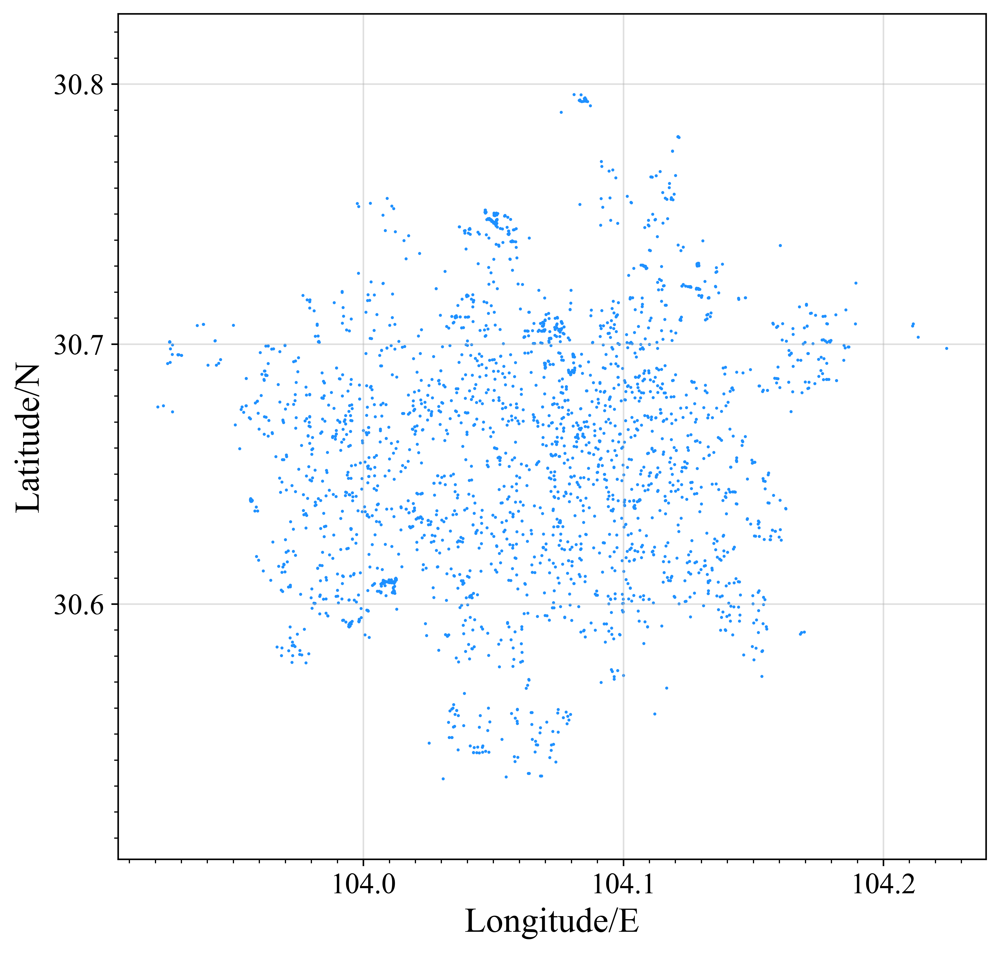

In [8]:
%matplotlib inline
plot(x,y)
plt.savefig("Distribution_coordinates.png",dpi=600,bbox_inches="tight")

# K-Means clustering using Scikit-learn
## Step1: Designate the number of clusters

Operating duration: 477.6463589668274s


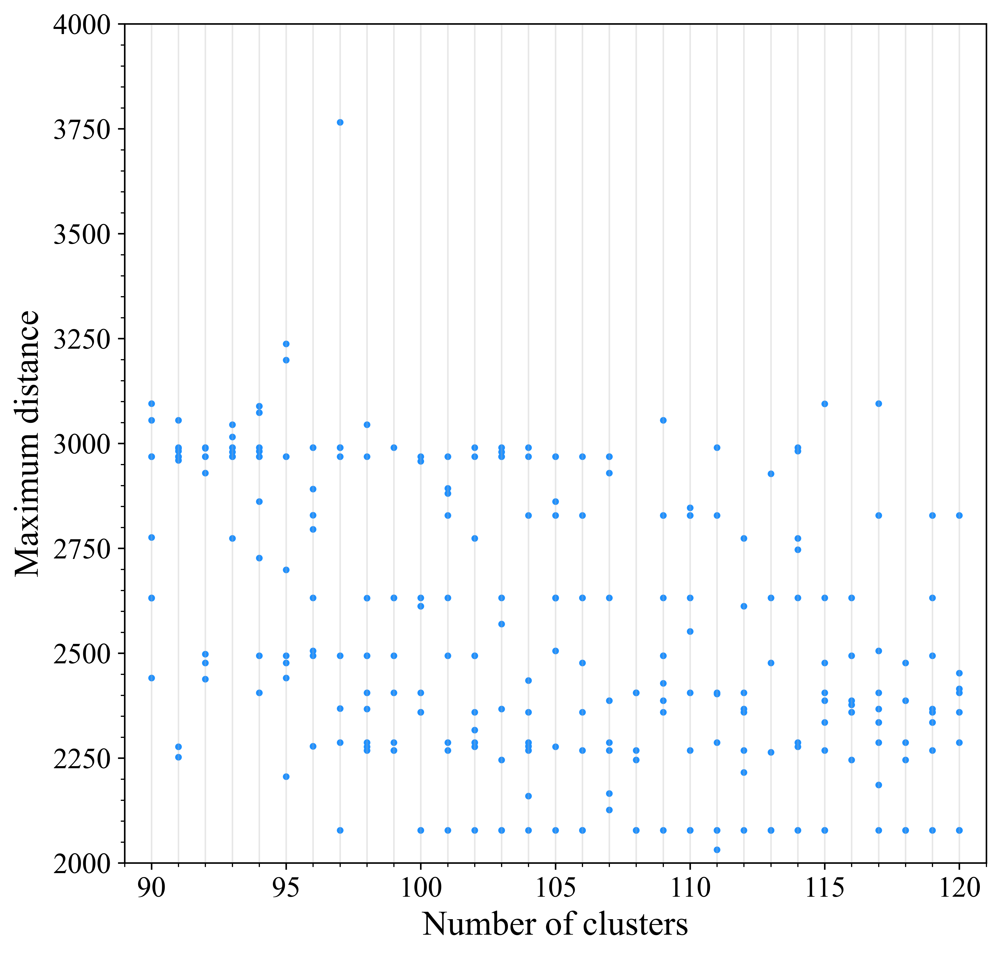

In [17]:
oper_start=time.time()
X=poi.values[1:,:2]
TSSE=[] #total sum square error
MSSE=[] #mean sum square error
K=120
start=90 #initial number of clusters
T=10 #number of tests
focus=[]
for t in range(T):
    maxdis=[]
    for k in range(start,K+1):
        SSE=[]
        md=KMeans(n_clusters=k)
        md.fit(X)
        labels=md.labels_
        centers=md.cluster_centers_
        for label in set(labels):
            SSE.append(np.sum((X[labels==label,:]-centers[label,:])**2))
        TSSE.append(np.sum(SSE))
        MSSE.append(np.mean(SSE))
        #print("k= %s :" %k,SSE)
        #print(centers)
        maxdis.append(KMCA_maxdis(centers,X,method="Spherical")) #get the max distance
    focus.append(maxdis)
fig=plt.figure(K+1,figsize=(8,8),dpi=600)
plt.rcParams['font.sans-serif']='Times New Roman'
ax=plt.subplot(111)
plt.grid(axis="x",which="both",alpha=0.3)
plt.xlim(xmin=start-1,xmax=K+1)
plt.ylim(ymin=2000,ymax=4000)
plt.xlabel("Number of clusters",fontsize=18)
plt.ylabel("Maximum distance",fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
xmajor=MultipleLocator(5)
ymajor=MultipleLocator(250)
xminor=MultipleLocator(1)
yminor=MultipleLocator(50)
ax.xaxis.set_major_locator(xmajor)
ax.yaxis.set_major_locator(ymajor)
ax.xaxis.set_minor_locator(xminor)
ax.yaxis.set_minor_locator(yminor)
for i in range(T):
    plt.scatter(range(start,K+1,1),focus[i],marker="o",s=6,c="#1E90FF")
plt.savefig("Cluster number_Max distance correlation.png",dpi=600,bbox_inches="tight")
oper_end=time.time()
duration=oper_end-oper_start
print("Operating duration: %ss" %duration) 

## Step2: Cluster analysis

Max distance: 2632.3027100665818m


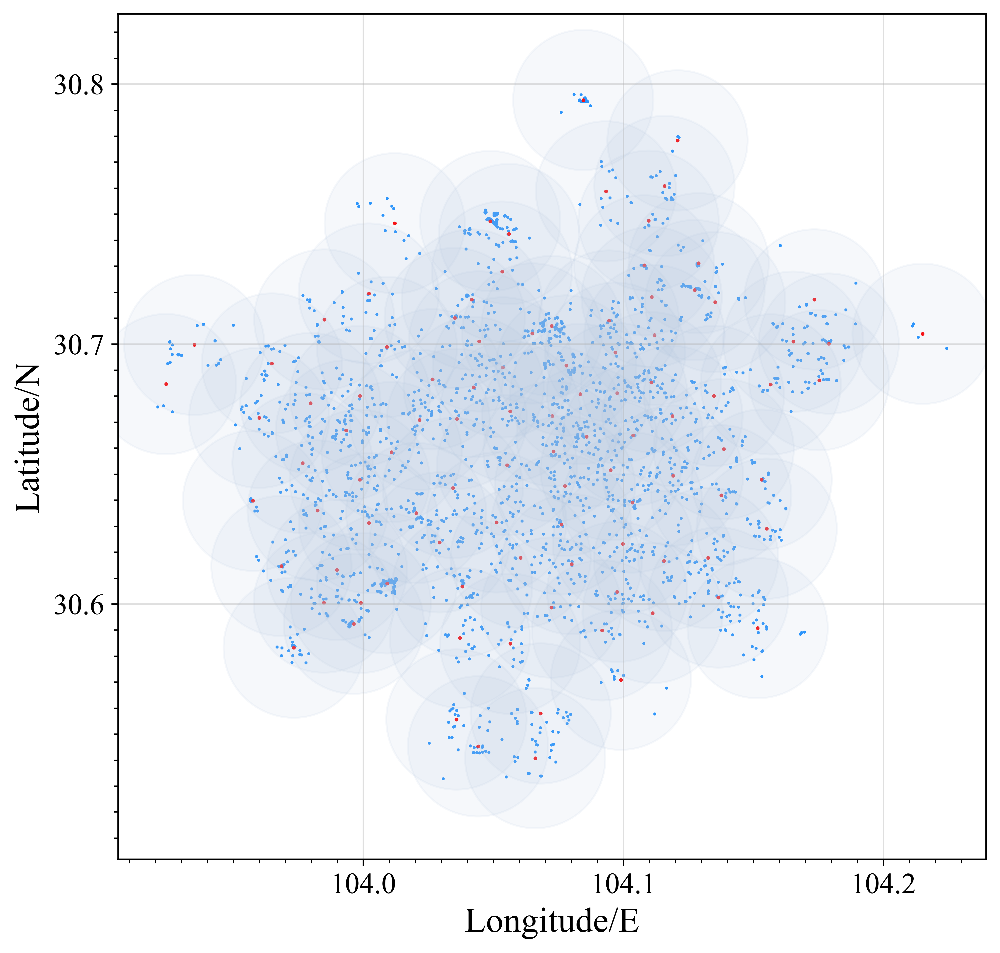

In [13]:
%matplotlib inline

#calculate the approximate scale of coordinates distance to real distance
X1=[]
Y1=[]
for x in range(1000):
    y=Spherical_distance(104.07,30.67,104.07,30.67+x*0.0001)
    X1.append(x*0.0001)
    Y1.append(y)
reg=LinearRegression()
reg.fit(np.array(X1).reshape(-1,1),np.array(Y1).reshape(-1,1))
b=float(reg.coef_[0][0]) #gradient=111201.78578548461, i.e., every 1° increase in coordinates leads to about 111200m increase in real distance, on average
a=float(reg.intercept_) #interception
x=sy.Symbol("x")
f=sy.solve([b*x+a-3000],[x])
radius=f[x] #3000m≈0.026977982°
x,y=poi["x"],poi["y"]
ax=plot(x,y)
#cluster number=100
location=poi.values[1:,:2]
k=100
KMCA=KMeans(k)
KMCA.fit(location)
labels=1+KMCA.labels_
centers=KMCA.cluster_centers_
#print(labels,"\n","-"*60,"\n",centers)
cx=centers.T[0]
cy=centers.T[1]
plt.scatter(cx,cy,c="r",s=0.8,marker="o") #label centers
plt.axis("equal")
maxdis=KMCA_maxdis(centers,location,method="Spherical")
print("Max distance: %sm" %maxdis)
for i in range(centers.shape[0]):
    circ=plt.Circle((centers[i][0],centers[i][1]),radius,color="lightsteelblue",alpha=0.1)
    ax.add_patch(circ)
plt.savefig("Initial covering.png",dpi=600,bbox_inches="tight")

# GA & Visualization

>>>Try: removing cluster center 77<<<
	Affected points: [2948, 3048, 3222, 3366, 3389]
>>>Cluster center 77: removal rejected<<<

>>>Try: removing cluster center 71<<<
	Affected points: [500, 511, 524, 618, 619, 647, 649, 655, 656, 657, 658, 660, 661, 662, 673, 691, 709, 718, 739, 747, 777, 779, 780, 781, 782, 818, 826, 849]
>>>Cluster center 71: removal rejected<<<

>>>Try: removing cluster center 72<<<
	Affected points: [32, 39, 941, 1394, 1411, 1412, 1486, 1490, 1491, 1493, 1496, 1497, 1501, 1502, 1503, 1505, 1508, 1509, 1510, 1526, 1538, 1616, 1631, 1633, 1635, 1704, 1710, 3405]
>>>Cluster center 72: removal confirmed<<<

>>>Try: removing cluster center 34<<<
	Affected points: [25, 954, 969, 1269, 1295, 1311, 1408, 1410, 1413, 1417, 1456, 1474, 1478, 1482, 1487, 1498, 1707, 3395, 3398, 3399, 3400, 3401, 3402, 3403, 3404, 3409, 3410, 3411, 3412, 3413]
>>>Cluster center 34: removal rejected<<<

>>>Try: removing cluster center 38<<<
	Affected points: [500, 511, 524, 554, 618, 619, 640

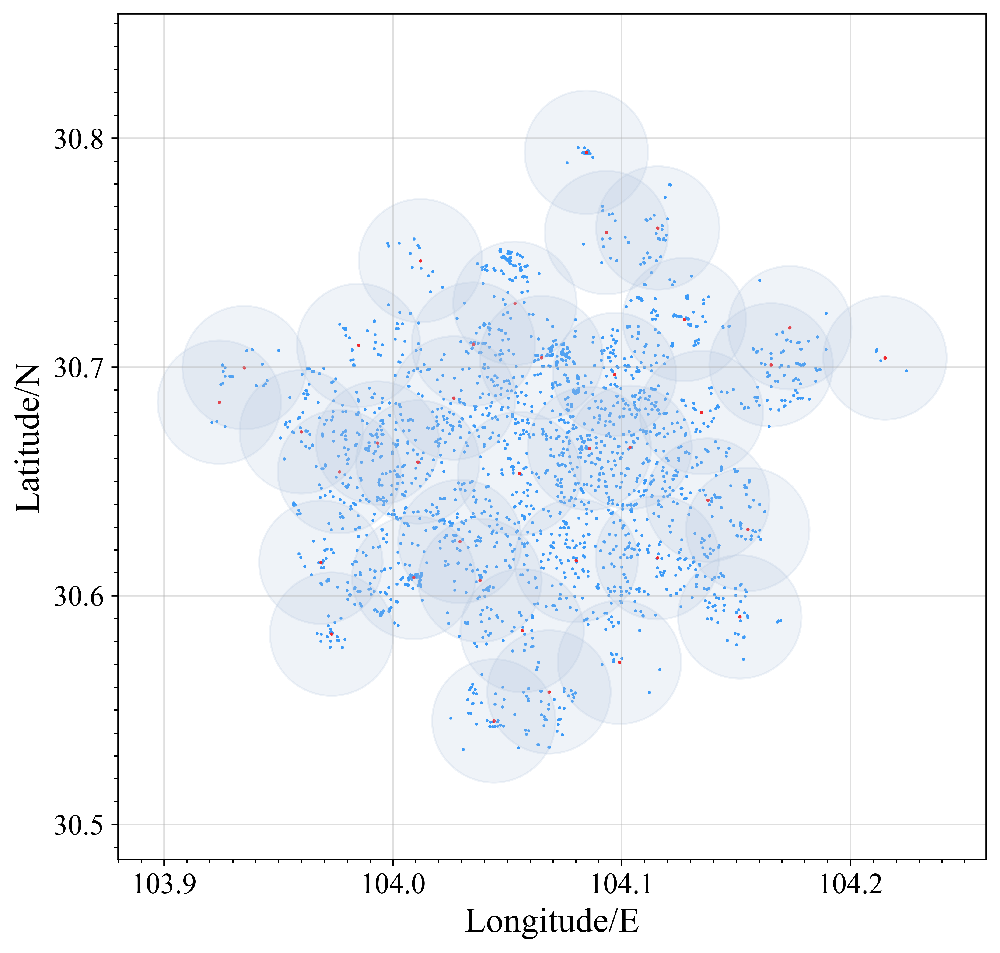

In [14]:
%matplotlib inline

start=time.time()
R=3000
x,y=poi["x"],poi["y"]
ax=plot(x,y)
#cluster number=100
location=poi.values[1:,:2]
n=100
maxdis=KMCA_maxdis(centers,location,method="Spherical")
spotnum=location.shape[0]
centernum=centers.shape[0]
centerlabel=np.arange(1,centernum+1)
covernum,coverset,covertimes=find_covered(centers,location,radius)
uncovered_num,uncovered_spots=find_uncovered(covertimes) #record uncovered points
centerlabel,coverset,covertimes=rank(centers,covernum,coverset)
#print(centerlabel)
finalist,finalcenter,final_coordinates=SCP_GA(centerlabel,coverset,covertimes)
print("-"*60,"Output","-"*60)
print("Maximum distance：%sm" %maxdis)
print("%s cluster centers retained" %len(finalist),"\nAs:\n%s" %final_coordinates)
for center in finalcenter:
    plt.scatter(center[0],center[1],marker="o",c="r",s=0.5)
    circ=plt.Circle((center[0],center[1]),radius,color="lightsteelblue",alpha=0.2)
    ax.add_patch(circ)
plt.savefig("Improved_covering.png",dpi=600,bbox_inches="tight")
plt.axis("equal")
covernum,coverset,covertimes=find_covered(np.array(finalcenter).reshape(-1,2),location,radius)
final=xlwt.Workbook()
s1=final.add_sheet("Retained recycling points",cell_overwrite_ok=True)
titles=["ID","Longitude/E","Latitude/N","Coverage"]
for i in range(len(titles)):
    s1.write(0,i,titles[i])
for j in range(len(finalcenter)):
    s1.write(j+1,0,j+1)
for k in range(len(finalcenter)):
    s1.write(1+k,1,finalcenter[k][0])
    s1.write(1+k,2,finalcenter[k][1])
    s1.write(1+k,3,covernum[k])
s2=final.add_sheet("Covered points",cell_overwrite_ok=True)
titles=["ID","Longitude/E","Latitude/N","Express outlet","District"]
places=pd.read_excel("成都_生活服务_快递点POI.xls",header=None).values[1:,:]
for i in range(len(titles)):
    s2.write(0,i,titles[i])
lines=0
for j in range(len(finalcenter)):
    coveree=coverset[j]
    for k in range(len(coveree)):
        spot=coveree[k]
        s2.write(1+lines+k,0,j+1)
        s2.write(1+lines+k,1,places[spot-1,0])
        s2.write(1+lines+k,2,places[spot-1,1])
        s2.write(1+lines+k,3,places[spot-1,3])
        s2.write(1+lines+k,4,places[spot-1,4])
    lines+=len(coveree)
final.save("Retained recycling points.xls")
end=time.time()
print("Operating duration%ss" %(end-start))

## Visualization

In [19]:
cd_map=fm.Map(location=[30.67, 104.07], zoom_start=12)
for i in range(len(finalcenter)):
    center=finalcenter[i]
    fm.Marker(location=[center[1],center[0]],popup=str(i),icon=fm.Icon(color="red",icon="info-sign")).add_to(cd_map)
    fm.Circle(radius=3000,location=[center[1],center[0]],popup=str(i),color="#3186cc",fill=True,fill_color="#3186cc").add_to(cd_map)
cd_map.save("Improved_covering.html")
cd_map

# Extension: Simulated annealing in route planning

Input the ID of recycling center 1-38： 2


回收点 2 覆盖量 131 需配备回收车数量 3
Optimal route：
           Spots
1          利达货运
2          发通托运
3      华蓉(通成)货运
4          庆丰物流
5          松峰物流
..          ...
127      宏鑫骅泰物流
128        君诚物流
129        安凯快运
130        蜀道物流
131  成都藏家物流有限公司

[131 rows x 1 columns] 
Distance travelled: 57.84529002359418km


<Figure size 432x288 with 0 Axes>

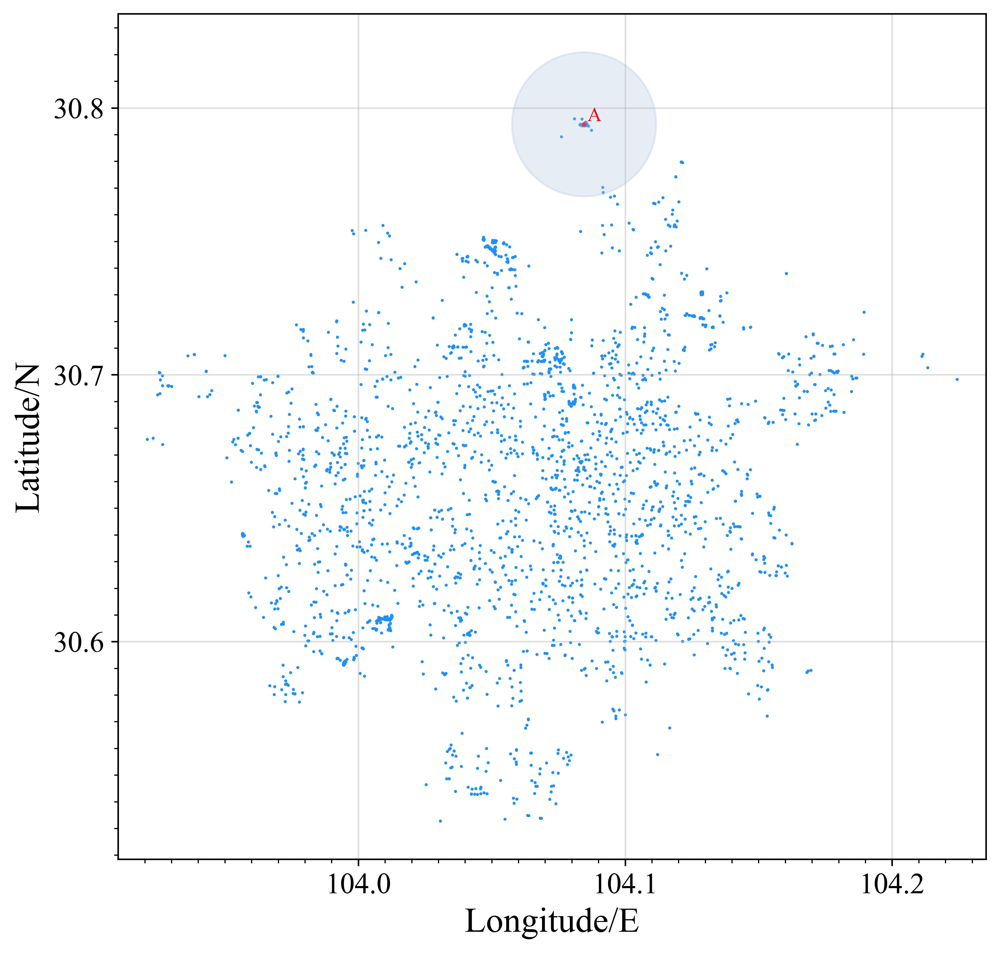

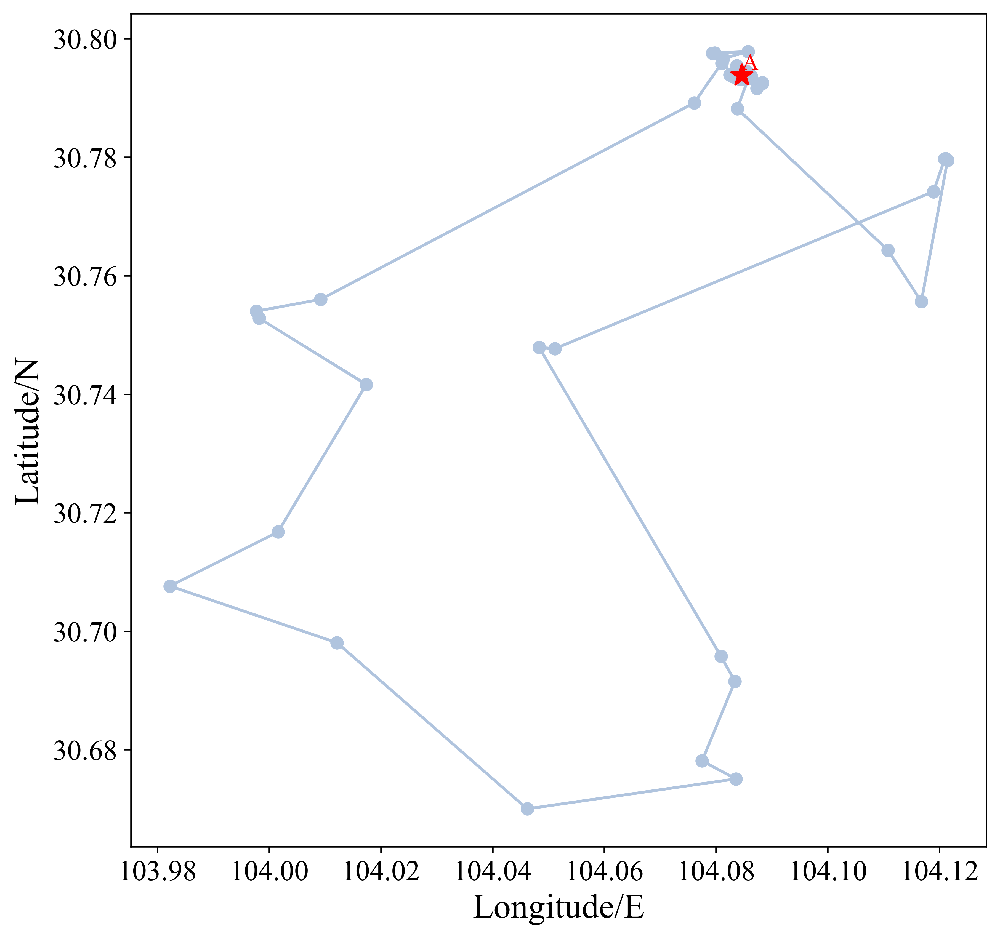

In [16]:
%matplotlib inline

s=pd.read_excel("Retained recycling points.xls",sheet_name="Retained recycling points",header=None).values[1:,:3]
p=pd.read_excel("Retained recycling points.xls",sheet_name="Covered points",header=None).values[1:,:4]
i=eval(input("Input the ID of recycling center 1-%s：" %s.shape[0]))
number=i
coverer=[]
for spot in s:
    if spot[0]==i:
        coverer.append([spot[1],spot[2]])
coverer=np.array(coverer).reshape(-1,2)
coveree=[]
for spot in p:
    if spot[0]==i:
        coveree.append([spot[1],spot[2]])
coveree=np.array(coveree).reshape(-1,2)
coveree_name=[]
order=arange(2,coveree.shape[0]+2)
for spot in p:
    if spot[0]==i:
        coveree_name.append(spot[3])
coveree_dict=dict(zip(order,coveree_name))
cover_amount=coveree.shape[0]
least_vehicles=cover_amount//50
if cover_amount-least_vehicles*50>10 or least_vehicles==0:
    vehicles=cover_amount//50+1
else:
    vehicles=cover_amount//50
print("回收点 {} 覆盖量 {} 需配备回收车数量 {}".format(str(i),cover_amount,vehicles))
x=coveree[:,0]
x.dtype="float64"
y=coveree[:,1]
y.dtype="float64"
d1=coverer[:,:]
d1.dtype="float64"
xy=c_[x,y]
xy=r_[d1,xy,d1]
N=xy.shape[0]
t=radians(xy)
d=array([[6371.393*arccos(cos(t[i,0]-t[j,0])*cos(t[i,1])*cos(t[j,1])+sin(t[i,1])*sin(t[j,1])) for i in range(N)]for j in range(N)]).real
path=arange(N)
L=inf
for j in range(1000):
    path0=arange(1,N-1)
    shuffle(path0)
    path0=r_[0,path0,N-1]
    L0=d[0,path0[1]] #Initialize
    for i in range(1,N-1):
        L0+=d[path0[i],path0[i+1]]
    if L0<L: 
        path=path0
        L=L0
#print(path+1,'\n',L)        
e=0.1**30
M=20000
at=0.999
T=1
for k in range(M):
    c=randint(1,N-1,2)
    c.sort()
    #print(c)
    c1=c[0]
    c2=c[1]
    df=d[path[c1-1],path[c2]]+d[path[c1],path[c2+1]]-d[path[c1-1],path[c1]]-d[path[c2],path[c2+1]]
    if df<0:
        path=r_[path[0],path[1:c1],path[c2:c1-1:-1],path[c2+1:N]]
        L=L+df
    else:
        if exp(-df/T)>=rand(1):
            path=r_[path[0],path[1:c1],path[c2:c1-1:-1],path[c2+1:N]]
            L=L+df
    T=T*at
    if T<e: 
        break
path_name=[]
for i in range(coveree.shape[0]):
    path_name.append(coveree_dict[path[i+1]+1])
print("Optimal route：\n",pd.DataFrame(path_name,index=range(1,cover_amount+1),columns=["Spots"]),"\nDistance travelled: %skm" %L)
xx=xy[path,0]
yy=xy[path,1]
x=location.T[0]
y=location.T[1]
plt.figure(1)
ax=plot(x,y)
plt.scatter(coverer[0][0],coverer[0][1],c="r",s=2,marker="o")
circ=plt.Circle((coverer[0][0],coverer[0][1]),0.027,color="lightsteelblue",alpha=0.3)
plt.annotate("A",xy=(coverer[0][0],coverer[0][1]),xytext=(coverer[0][0]+0.00125,coverer[0][1]+0.00125),fontsize=10,color="r")
ax.add_patch(circ)
plt.figure(2)
plt.figure(figsize=(8,8),dpi=500)
plt.xlabel("Longitude/E",fontsize=18)
plt.ylabel("Latitude/N",fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.plot(xx,yy,"-o",color="lightsteelblue",markersize=6)
plt.plot(coverer[0][0],coverer[0][1],"*",color="r",markersize=12)
plt.annotate("A",xy=(coverer[0][0],coverer[0][1]),xytext=(coverer[0][0],coverer[0][1]+0.001),fontsize=12,color="r")
route=xlwt.Workbook()
sheet=route.add_sheet("Optimal route",cell_overwrite_ok=True)
titles=["ID","Express outlets"]
for i in range(len(titles)):
    sheet.write(0,i,titles[i])
for j in range(len(coveree)):
    sheet.write(1+j,0,1+j)
    sheet.write(1+j,1,path_name[j])
sheet.write(len(coveree)+1,0,"Distance travelled")
sheet.write(len(coveree)+1,1,"%skm" %L)